In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

In [2]:
metalgrid = cv.imread('metalgrid.jpg',cv.IMREAD_GRAYSCALE)

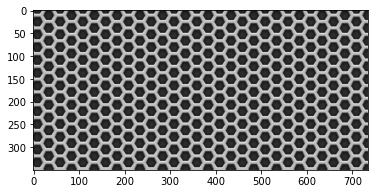

In [3]:
plt.imshow(metalgrid,cmap='gray')
plt.show()

# Calculo de gradientes

## Normal - Sobel

In [4]:
blurred_grid = cv.GaussianBlur(metalgrid,(5,5),0)


# Aplicamos Sobelx en 'float32' y luego convertimos de nuevo a 8-bit para evitar overflow
sobelx = cv.Sobel(blurred_grid,cv.CV_32F,1,0,ksize=3) # Calcula derivada en X
absx = np.absolute(sobelx) # Toma valor absoluto, no nos importa la direccion
sobelx_escala = absx/absx.max()*255 # Reescalamos
sobelx_8u = np.uint8(sobelx_escala) # Cambiamos el datatype

# De igual modo para Sobely
sobely = cv.Sobel(blurred_grid,cv.CV_32F,0,1,ksize=3)
absy = np.absolute(sobely)
sobely_escala = absy/absy.max()*255
sobely_8u = np.uint8(sobely_escala)

# De los gradiente calculamos Magnitud y lo pasamos a 8-bit (Opcional)
mag = np.hypot(sobelx_8u, sobely_8u) # Calcula el modulo del gradiente
mag = mag/mag.max()*255 # Redefinimos el maximo gradiente ocmo el nuevo blanco
sobel_mag = np.uint8(mag) # Volvemos a uint9

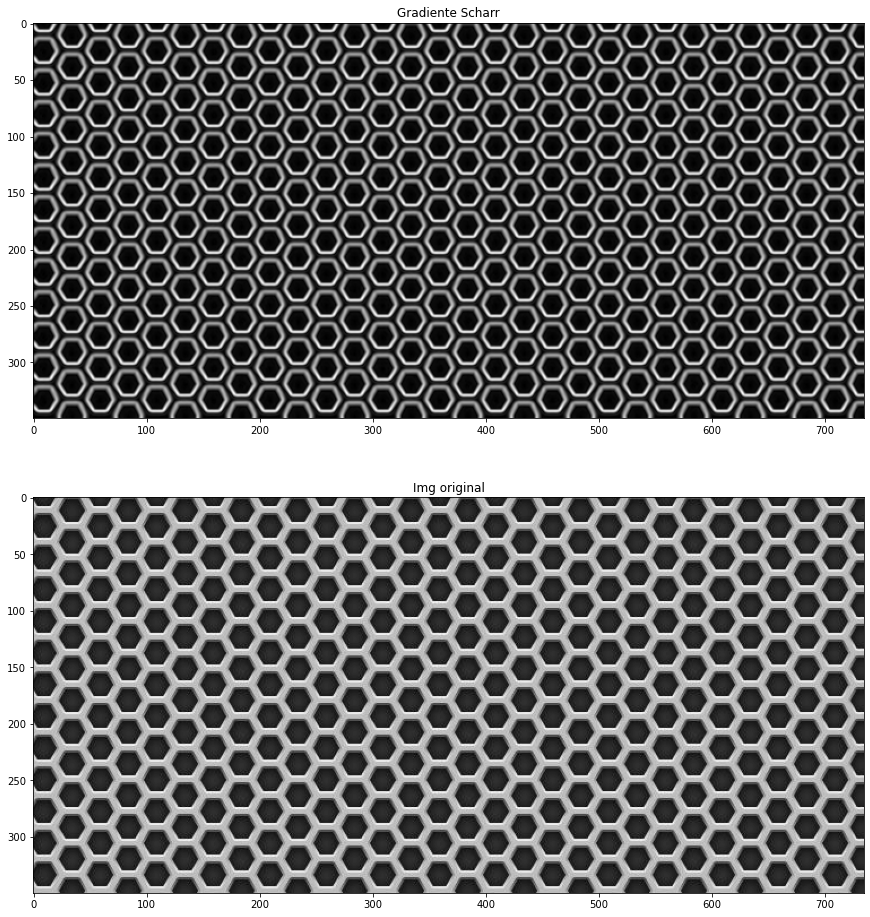

In [5]:
f ,ax = plt.subplots(ncols=1,nrows=2,figsize=(16,16))
ax[0].imshow(sobel_mag,cmap='gray')
ax[0].set_title('Gradiente Scharr')
ax[1].imshow(metalgrid,cmap='gray')
ax[1].set_title('Img original')
plt.show()


## Normal - Scharr

In [6]:
blurred_grid = cv.GaussianBlur(metalgrid,(5,5),0)


# Aplicamos Sobelx en 'float32' y luego convertimos de nuevo a 8-bit para evitar overflow
scharr_x = cv.Scharr(blurred_grid,cv.CV_32F,1,0) # Calcula derivada en X
absx = np.absolute(scharr_x) # Toma valor absoluto, no nos importa la direccion
scharr_x_escala = absx/absx.max()*255 # Reescalamos
scharr_x_8u = np.uint8(scharr_x_escala) # Cambiamos el datatype

# De igual modo para Sobely
scharr_y = cv.Scharr(blurred_grid,cv.CV_32F,0,1)
absy = np.absolute(scharr_y)
scharr_y_escala = absy/absy.max()*255
scharr_y_8u = np.uint8(scharr_y_escala)

# De los gradiente calculamos Magnitud y lo pasamos a 8-bit (Opcional)
mag = np.hypot(scharr_x_8u, scharr_y_8u) # Calcula el modulo del gradiente
mag = mag/mag.max()*255 # Redefinimos el maximo gradiente ocmo el nuevo blanco
scharr_mag = np.uint8(mag) # Volvemos a uint9


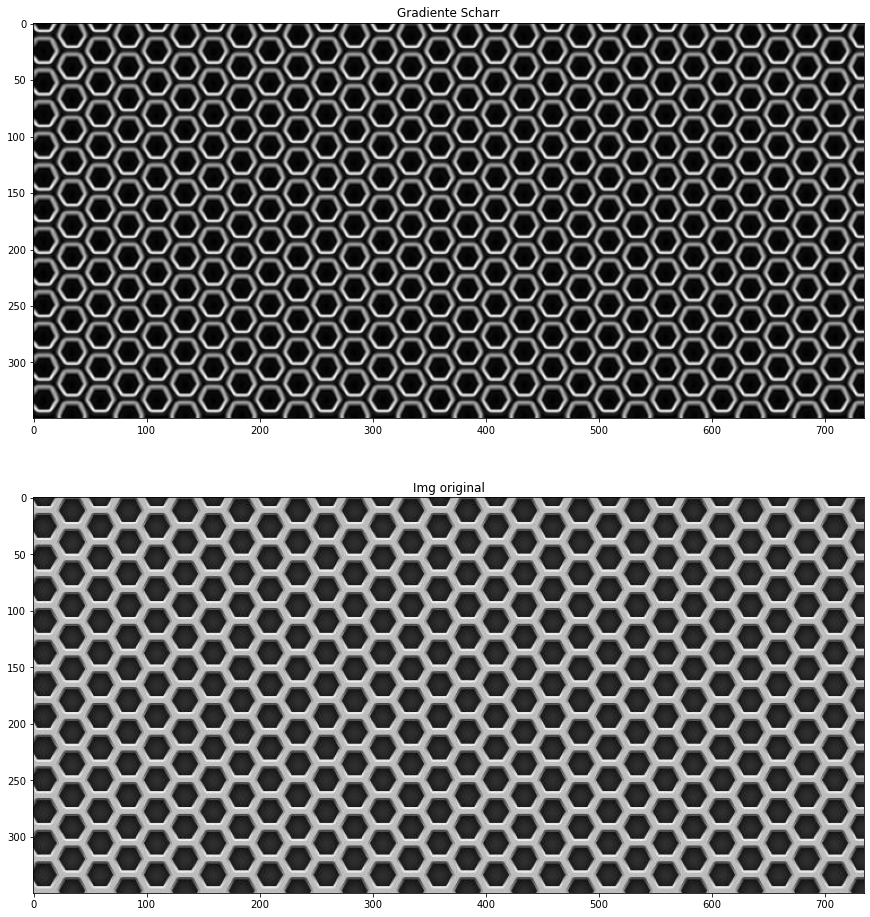

In [7]:

f ,ax = plt.subplots(ncols=1,nrows=2,figsize=(16,16))
ax[0].imshow(scharr_mag,cmap='gray')
ax[0].set_title('Gradiente Scharr')
ax[1].imshow(metalgrid,cmap='gray')
ax[1].set_title('Img original')
plt.show()


## Sobel vs Scharr

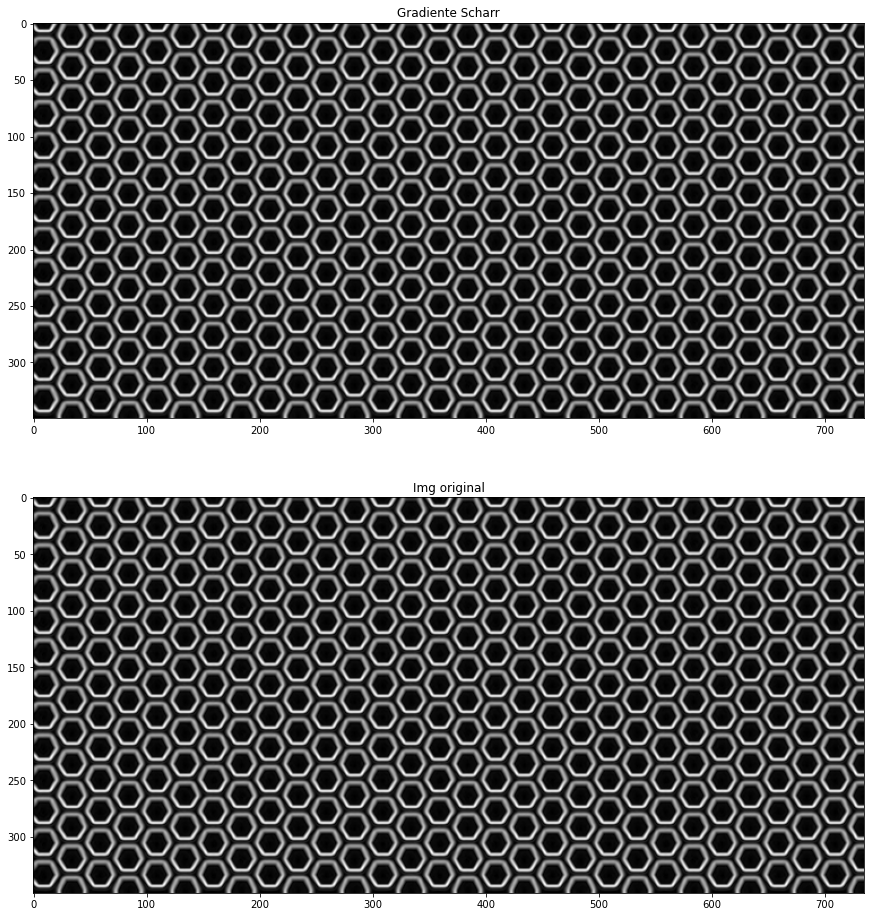

In [8]:
%matplotlib inline
f ,ax = plt.subplots(ncols=1,nrows=2,figsize=(16,16))
ax[0].imshow(sobel_mag,cmap='gray')
ax[0].set_title('Gradiente Scharr')
ax[1].imshow(scharr_mag,cmap='gray')
ax[1].set_title('Img original')
plt.show()


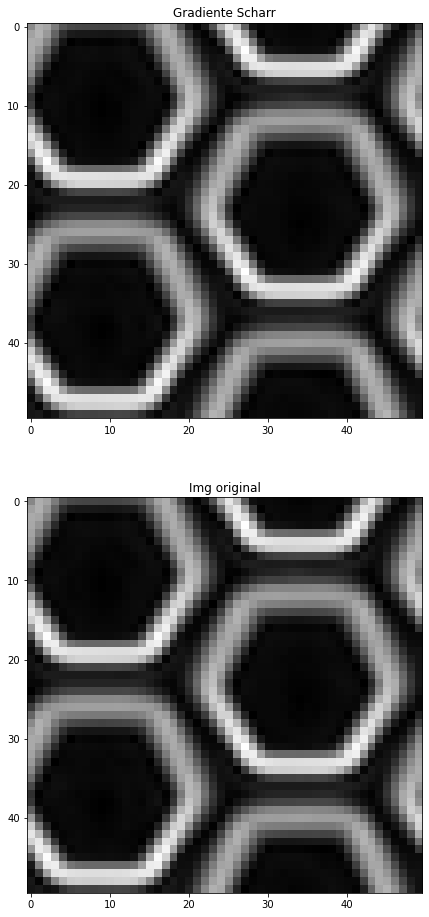

In [9]:
%matplotlib inline
f ,ax = plt.subplots(ncols=1,nrows=2,figsize=(16,16))
ax[0].imshow(sobel_mag[100:150,100:150],cmap='gray')
ax[0].set_title('Gradiente Scharr')
ax[1].imshow(scharr_mag[100:150,100:150],cmap='gray')
ax[1].set_title('Img original')
plt.show()


## Campo de gradiente

Vamos a usar los valores de los gradientes para plotearlos con sus direcciones y magnitutes correspondientes.

En la primer imagen, no se ve nada porque están ploteados todos los puntos y se superponen.

En la segunda, hacemos un poco de zoom y logramos ver los los gradientes fuertes en los bordes de la reja y como **dentro y sobre el enrejado, no hay gradiente por ser una intensidad uniforme.**

In [10]:
blurred_metalgrid = cv.GaussianBlur(metalgrid,(5,5),0)

# Aplicamos Sobel X para conseguir la dX
sobelx = cv.Sobel(blurred_metalgrid,cv.CV_32F,1,0,ksize=3)
sobelx_ajustado = sobelx / 255

# De igual modo para Sobely
sobely = cv.Sobel(blurred_metalgrid,cv.CV_32F,0,1,ksize=3)
sobely_ajustado = sobely / 255


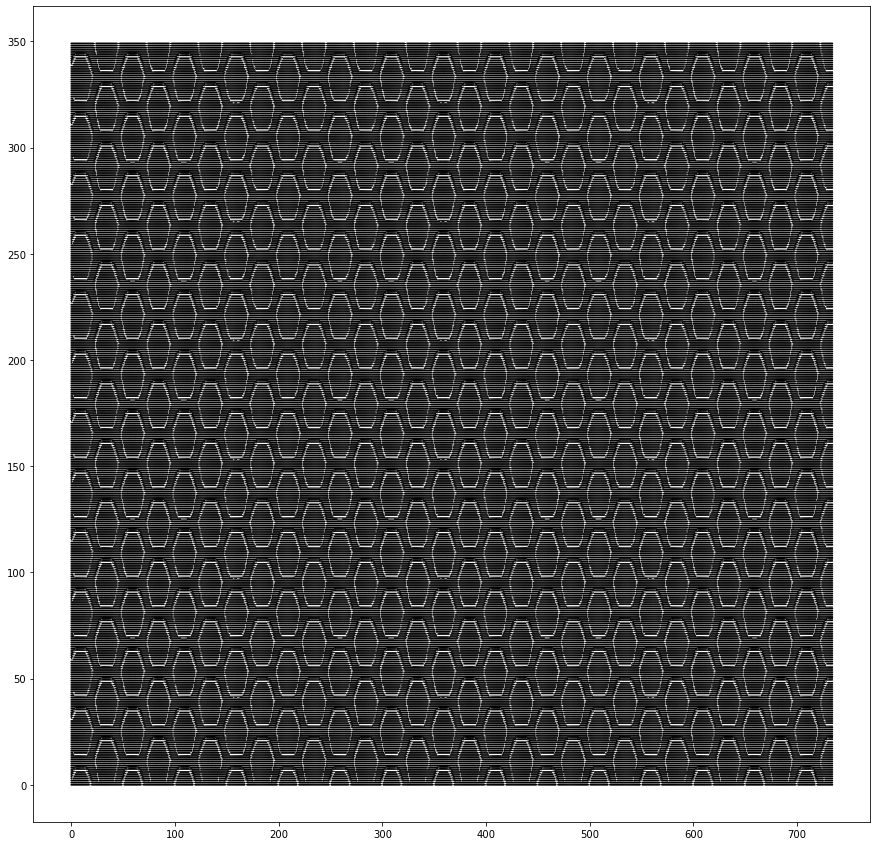

In [11]:

f, ax = plt.subplots(figsize=(15,15))
#X,Y = np.mgrid()
ax.quiver(sobelx_ajustado,sobely_ajustado,units='xy')

plt.show()

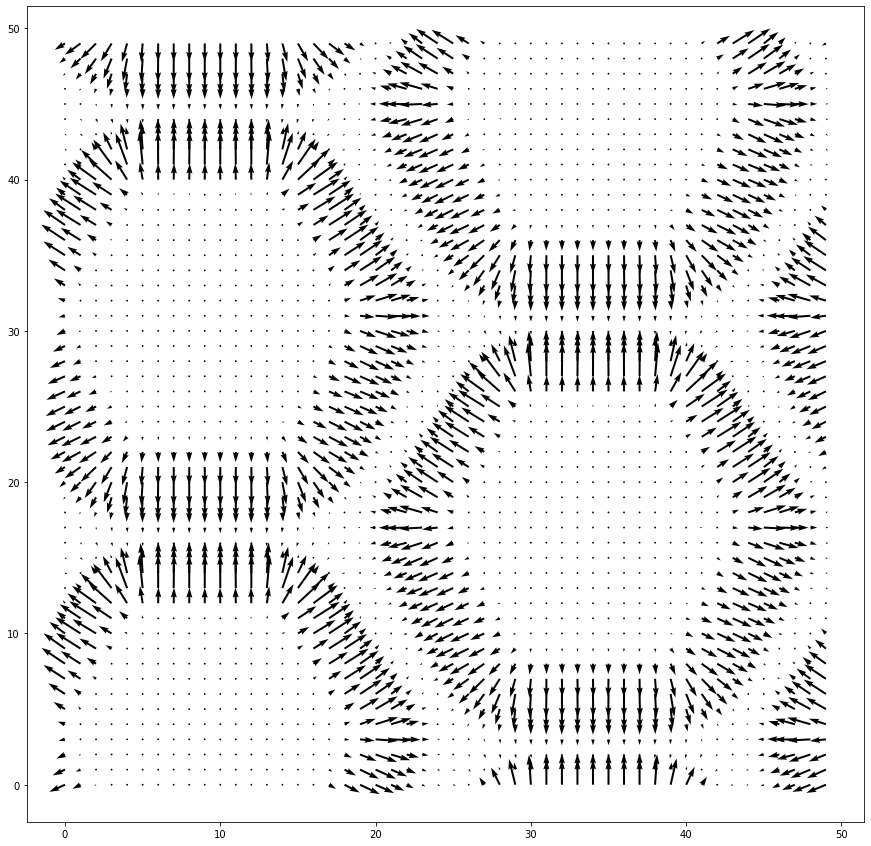

In [12]:
f, ax = plt.subplots(figsize=(15,15))
#X,Y = np.mgrid()
ax.quiver(sobelx_ajustado[50:100,50:100],sobely_ajustado[50:100,50:100],units='xy')

plt.show()

# Tela 2

In [13]:
tela = cv.imread('tela2.jpg')
tela = cv.cvtColor(tela,cv.COLOR_BGR2RGB)

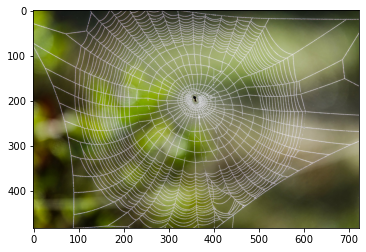

In [14]:
plt.imshow(tela)
plt.show()

In [15]:
tela_gray = cv.cvtColor(tela,cv.COLOR_RGB2GRAY)

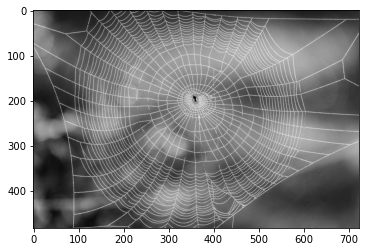

In [16]:
plt.imshow(tela_gray,cmap='gray')
plt.show()

In [17]:
tela_eq = cv.equalizeHist(tela_gray)

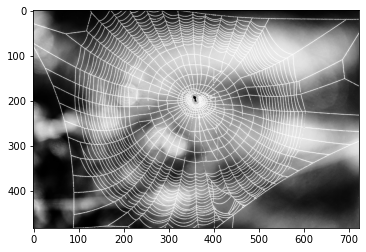

In [18]:
plt.imshow(tela_eq,cmap='gray')
plt.show()

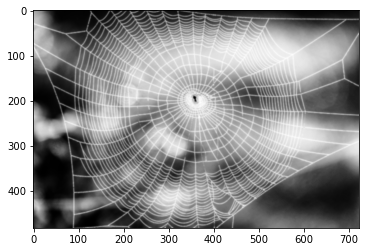

In [19]:
blurred_tela_eq = cv.GaussianBlur(tela_eq,(5,5),sigmaX=1,sigmaY=1)
plt.imshow(blurred_tela_eq,cmap='gray')
plt.show()

# Cálculo de gradientes

## Normal - Sobel

In [20]:
# Aplicamos Sobelx en 'float32' y luego convertimos de nuevo a 8-bit para evitar overflow
sobelx = cv.Sobel(blurred_tela_eq,cv.CV_32F,1,0,ksize=3) # Calcula derivada en X
absx = np.absolute(sobelx) # Toma valor absoluto, no nos importa la direccion
sobelx_escala = absx/absx.max()*255 # Reescalamos
sobelx_8u = np.uint8(sobelx_escala) # Cambiamos el datatype

# De igual modo para Sobely
sobely = cv.Sobel(blurred_tela_eq,cv.CV_32F,0,1,ksize=3)
absy = np.absolute(sobely)
sobely_escala = absy/absy.max()*255
sobely_8u = np.uint8(sobely_escala)

# De los gradiente calculamos Magnitud y lo pasamos a 8-bit (Opcional)
mag = np.hypot(sobelx_8u, sobely_8u) # Calcula el modulo del gradiente
mag = mag/mag.max()*255 # Redefinimos el maximo gradiente ocmo el nuevo blanco
sobel_mag = np.uint8(mag) # Volvemos a uint9

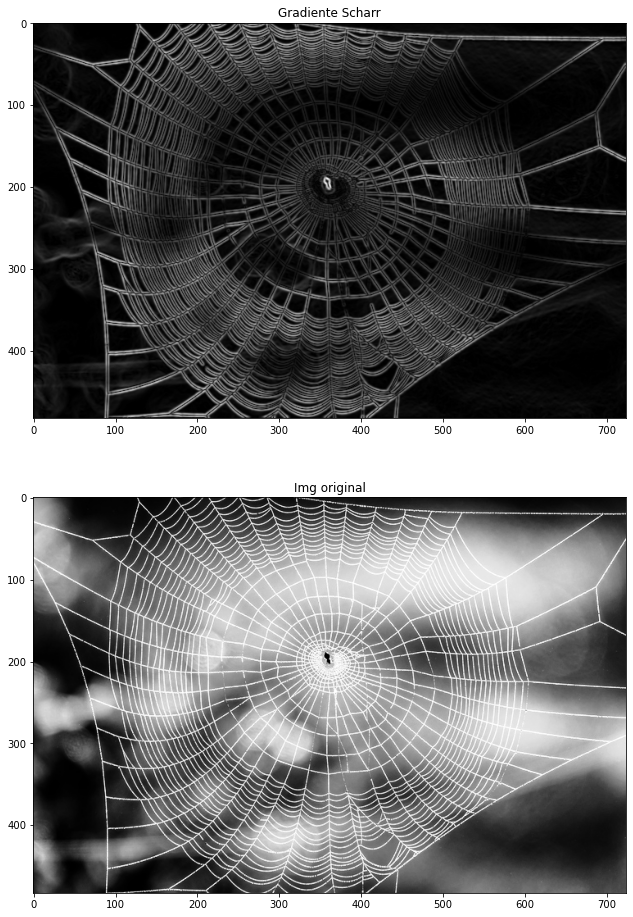

In [21]:
f ,ax = plt.subplots(ncols=1,nrows=2,figsize=(16,16))
ax[0].imshow(sobel_mag,cmap='gray')
ax[0].set_title('Gradiente Scharr')
ax[1].imshow(tela_eq,cmap='gray')
ax[1].set_title('Img original')
plt.show()


## Normal - Scharr

In [22]:
# Aplicamos Sobelx en 'float32' y luego convertimos de nuevo a 8-bit para evitar overflow
scharr_x = cv.Scharr(blurred_tela_eq,cv.CV_32F,1,0) # Calcula derivada en X
absx = np.absolute(scharr_x) # Toma valor absoluto, no nos importa la direccion
scharr_x_escala = absx/absx.max()*255 # Reescalamos
scharr_x_8u = np.uint8(scharr_x_escala) # Cambiamos el datatype

# De igual modo para Sobely
scharr_y = cv.Scharr(blurred_tela_eq,cv.CV_32F,0,1)
absy = np.absolute(scharr_y)
scharr_y_escala = absy/absy.max()*255
scharr_y_8u = np.uint8(scharr_y_escala)

# De los gradiente calculamos Magnitud y lo pasamos a 8-bit (Opcional)
mag = np.hypot(scharr_x_8u, scharr_y_8u) # Calcula el modulo del gradiente
mag = mag/mag.max()*255 # Redefinimos el maximo gradiente ocmo el nuevo blanco
scharr_mag = np.uint8(mag) # Volvemos a uint9


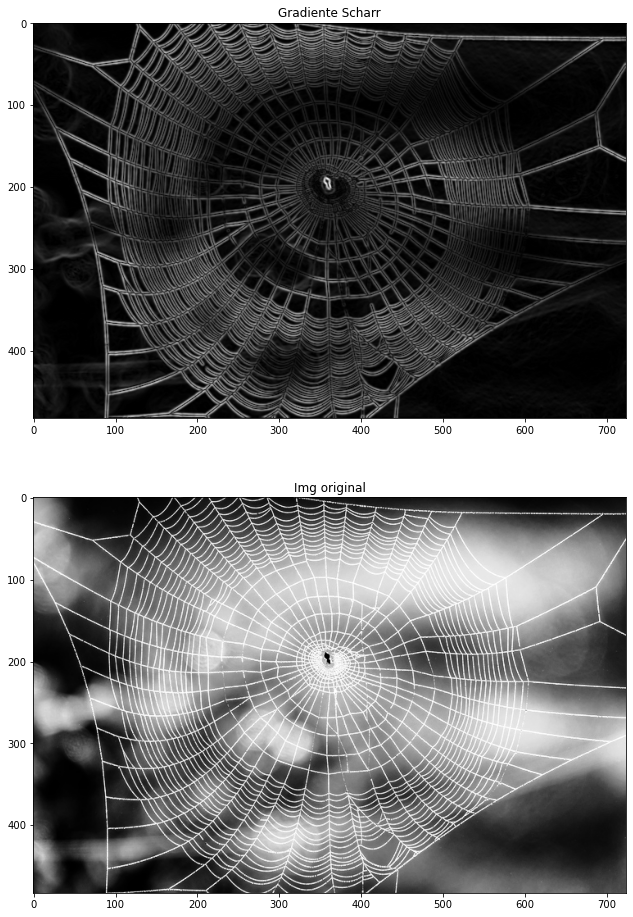

In [23]:

f ,ax = plt.subplots(ncols=1,nrows=2,figsize=(16,16))
ax[0].imshow(scharr_mag,cmap='gray')
ax[0].set_title('Gradiente Scharr')
ax[1].imshow(tela_eq,cmap='gray')
ax[1].set_title('Img original')
plt.show()


## Sobel vs Scharr

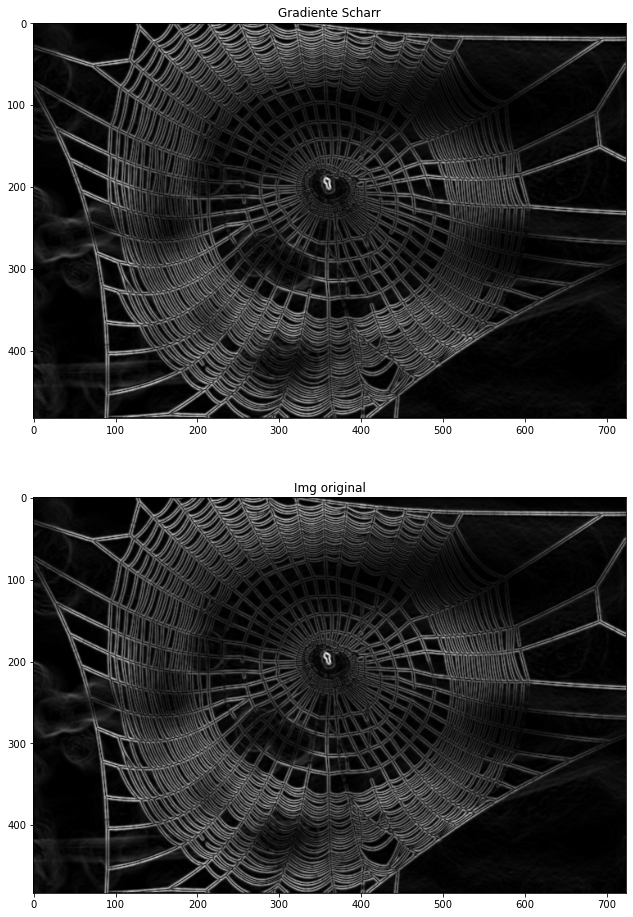

In [24]:
f ,ax = plt.subplots(ncols=1,nrows=2,figsize=(16,16))
ax[0].imshow(sobel_mag,cmap='gray')
ax[0].set_title('Gradiente Scharr')
ax[1].imshow(scharr_mag,cmap='gray')
ax[1].set_title('Img original')
plt.show()


## Campo de gradiente - Tela

In [25]:
blurred_tela_eq = cv.GaussianBlur(tela_eq,(5,5),0)

# Aplicamos Sobel X para conseguir la dX
sobelx = cv.Sobel(blurred_tela_eq,cv.CV_32F,1,0,ksize=3)
sobelx_ajustado = sobelx / 255

# De igual modo para Sobely
sobely = cv.Sobel(blurred_tela_eq,cv.CV_32F,0,1,ksize=3)
sobely_ajustado = sobely / 255


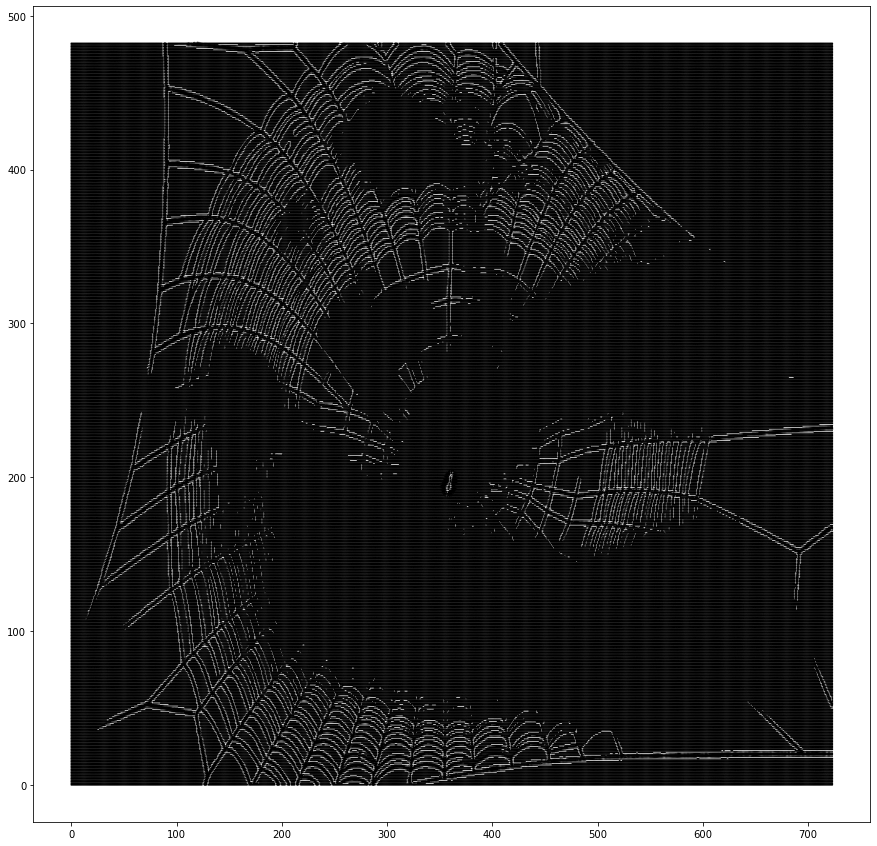

In [26]:
f, ax = plt.subplots(figsize=(15,15))
#X,Y = np.mgrid()
ax.quiver(sobelx_ajustado,sobely_ajustado,units='xy')

plt.show()

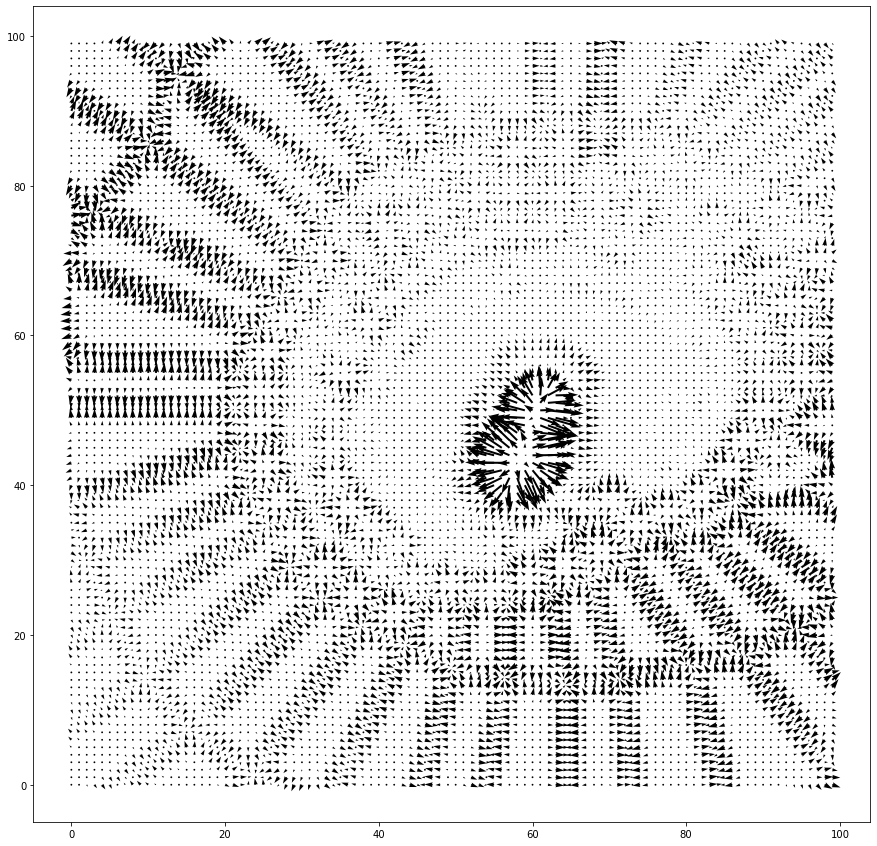

In [27]:
f, ax = plt.subplots(figsize=(15,15))
#X,Y = np.mgrid()
ax.quiver(sobelx_ajustado[150:250,300:400],sobely_ajustado[150:250,300:400],units='xy')

plt.show()

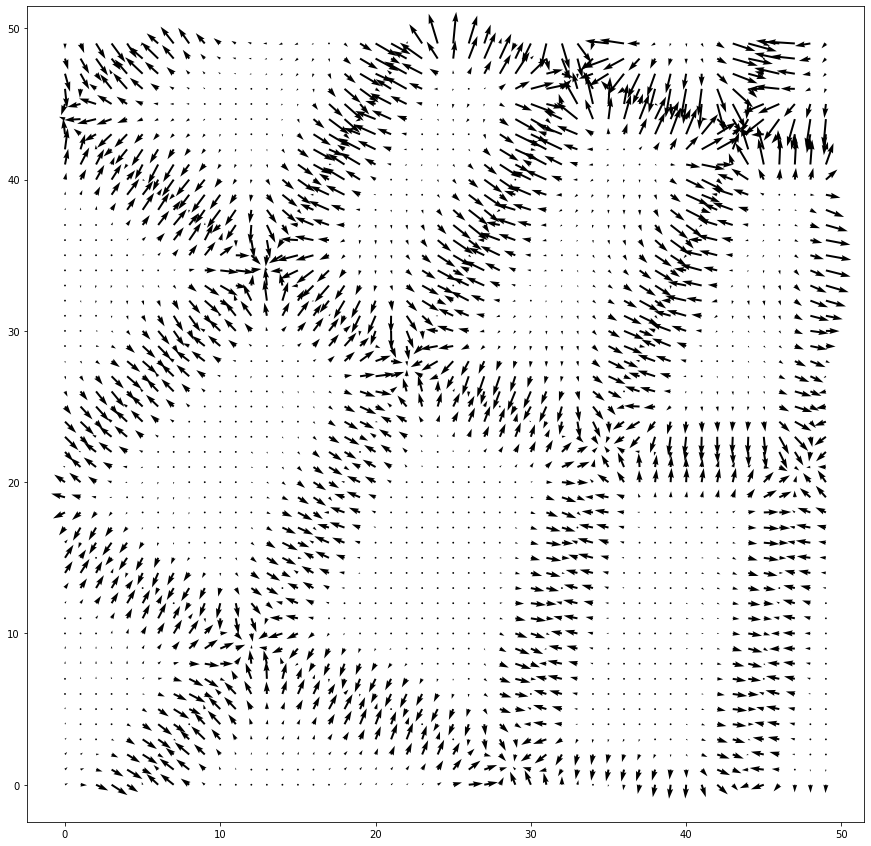

In [29]:
f, ax = plt.subplots(figsize=(15,15))
#X,Y = np.mgrid()
ax.quiver(sobelx_ajustado[100:150,300:350],sobely_ajustado[100:150,300:350],units='xy')

plt.show()